<h1>Firstly you must have the following modules installed on your local server (personal computer)</h1>
<ol>
<li>Numpy 
<li>pandas
<li>matplotlib
<li>and most importantly the famous wordcloud lib by amuller
</ol>
<h2> <em> RUN THE FIRST CELL  IF YOU ARE GOING TO USE THE ONLINE NOTEBOOK , if not you have to install the modules on your local machine</em> </h2>

In [3]:
#intalling the moduels that will help visualize the wordcloud
import sys
!conda install --yes --prefix {sys.prefix} numpy
!conda install --yes --prefix {sys.prefix} pandas
!conda install --yes --prefix {sys.prefix} matplotlib
!conda install --yes --prefix {sys.prefix} numpy
!conda install --yes --prefix {sys.prefix} wordcloud

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\mar_k\anaconda3

  added / updated specs:
    - numpy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-4.8.4                |           py38_0         2.9 MB
    openssl-1.1.1g             |       he774522_0         4.8 MB
    ------------------------------------------------------------
                                           Total:         7.7 MB

The following packages will be SUPERSEDED by a higher-priority channel:

  conda              conda-forge::conda-4.8.4-py38h32f6830~ --> pkgs/main::conda-4.8.4-py38_0
  openssl                                       conda-forge --> pkgs/main




openssl-1.1.1g       | 4.8 MB    |            |   0% 
openssl-1.1.1g       | 4.8 MB    |            |   0% 
openssl-1.1.1g       | 4.8 MB    | 1          |   2% 
openssl-1.1.1g       | 4.8 MB    | 3  

In [1]:
# Start with loading all necessary libraries
import numpy as np
import pandas as pd
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
# ImageColorGenetator is an important function that will enable us to mask PNG images under the cloud

import matplotlib.pyplot as plt
%matplotlib inline

<h2> The upcoming cell will show the main patameters of the WordCloud instance and the things you can change, pay close attention that all variables are set to their default ones so you are only asked about the text itself </h2>

In [6]:
#?WordCloud

<ul><li><h2>This code is for information only and you cannot run this cell, here is how I calculate the frequencies of the words in a text eleminating certain words and non-alpha characters<h2>
<li><h3>In python a dictionary is a data-structure where you can store data in the key-value structure ex: { job : 2, carrer:4 } here the keys are job and carrer and their values are 2 and 4. I will use the words in the text as the keys and the no of times the word appear as the corresponding value to that key</h3>
<li><h4> Note that this code uses the str.lower() fuction so it is not case senstive</h4></ul>

def calculate_frequencies(file_contents):
    # Here is a list of punctuations and uninteresting words you can use to process your text
    punctuations = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    uninteresting_words = ["the", "a", "to", "if", "is", "it", "of", "and", "or", "an", "as", "i","on", "me", "my", \
    "we", "our", "ours", "you", "your", "yours", "he", "she", "him", "his", "her", "hers", "its", "they", "them", \
    "their", "what", "which", "who", "whom", "this", "that", "am", "are", "was", "were", "be", "been", "being", \
    "have", "has", "had", "do", "does", "did", "but", "at", "by", "with", "from", "here", "when", "where", "how", \
    "all", "any", "both", "each", "few", "more", "some", "such", "no", "nor", "too", "very", "can", "will", "just","for","in","out","not","there","drink", "now", "wine", "flavor", "flavors"]
    
   
    final_dic={}
    for char in file_contents:
        if char  in punctuations:
            file_contents=file_contents.replace(char,"")
    file_contents=file_contents.split()
    for words in file_contents:
        words= words.lower()
        if words not in  uninteresting_words:
            if words  not in final_dic:
                final_dic[words]=0
            final_dic[words]+=1
    
    
    #wordcloud
    cloud = WordCloud(background_color="white").generate_from_frequencies(final_dic)
    return cloud.to_array()

<h2>In the next cell you will put the file dir of the .txt file that you wish to generate a wordcloud for</h2>

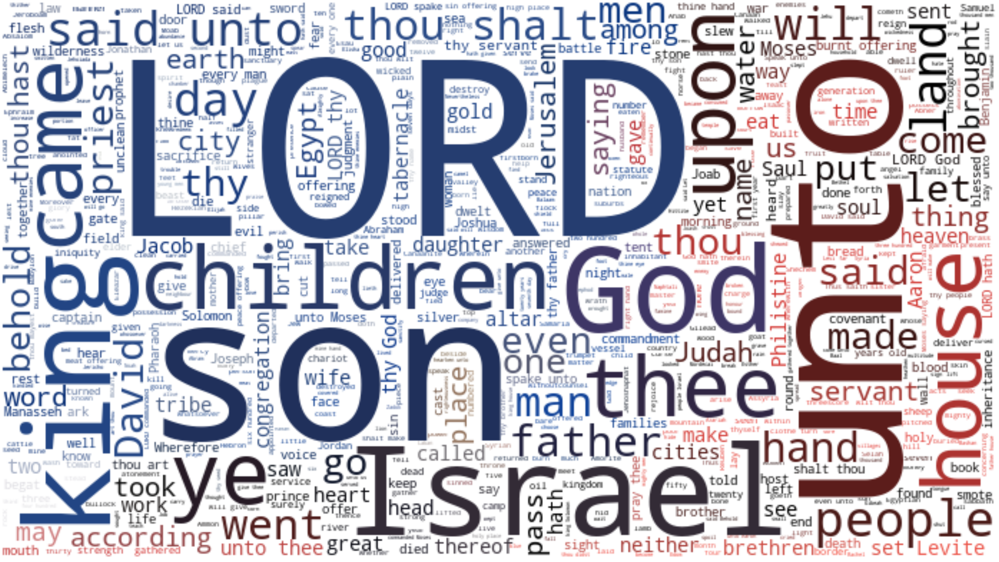

In [2]:
# Generate a word cloud image
file = open("C:\\Users\\mar_k\\OneDrive\\Desktop\\KJV bible.txt")

# note that if ur .txt file has a string that is repeated so many times like the names is a interview ex mark said :
# incomment this function and change ur file
#file = open("C:\\Users\\mar_k\\OneDrive\\Desktop\\NC.#txt",encoding="utf8")
#text = file.read().replace("Hillary #Clinton: ", " ")
#print(text)
# here we will elemenate all the blank spaces from the text using the replace function

text = file.read().replace("\n", " ")

# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["drink", "now", "wine", "flavor", "flavors"])

#open the PNG image you want ur wordcloud to be masked on 
mask = np.array(Image.open("C:\\Users\\mar_k\\Downloads\\us1.png"))
wordcloud_usa = WordCloud(stopwords=stopwords, background_color="white", mode="RGBA", max_words=1000, mask=mask).generate(text)

# create coloring from image, you can change the size of the image by figsize
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[100,100])
plt.imshow(wordcloud_usa.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

# store to file uncomment it if you want to save it
#plt.savefig("C:\\Users\\mar_k\\Downloads\\us1w.png", format="png")

plt.show()